In [ ]:
#https://towardsdatascience.com/auto-generated-knowledge-graphs-92ca99a81121

In [62]:
import pandas as pd
import re
import spacy
import os.path
my_path = os.path.abspath('')

nlp = spacy.load('en_core_web_lg')
nlp.max_length = 1000000
def entity_pairs(text):
    text = re.sub(r'\n+', '.', text)  # replace multiple newlines with period
    text = re.sub(r'\[\d+\]', ' ', text)  # remove reference numbers
    text = nlp(text)

    sentences = [sent.string.strip() for sent in text.sents]  # split text into sentences
    ent_pairs = list()
    for sent in sentences:
        sent = nlp(sent)
        spans = list(sent.ents) # collect nodes
        spans = spacy.util.filter_spans(spans)
        with sent.retokenize() as retokenizer:
            [retokenizer.merge(span) for span in spans]
        dep = [token.dep_ for token in sent]
        if (dep.count('obj')+dep.count('dobj'))==1 and (dep.count('subj')+dep.count('nsubj'))==1:
            for token in sent:
                if token.dep_ in ('obj', 'dobj'):  # identify object nodes
                    subject = [w for w in token.head.lefts if w.dep_
                               in ('subj', 'nsubj')]  # identify subject nodes
                    if subject:
                        subject = subject[0]
                        # identify relationship by root dependency
                        relation = [w for w in token.ancestors if w.dep_ == 'ROOT']  
                        if relation:
                            relation = relation[0]
                            # add adposition or particle to relationship
                            if relation.nbor(1).pos_ in ('ADP', 'PART'):  
                                relation = ' '.join((str(relation),
                                        str(relation.nbor(1))))
                        else:
                            relation = 'unknown'
                        subject, subject_type = refine_ent(subject, sent)
                        token, object_type = refine_ent(token, sent)
                        ent_pairs.append([str(subject), str(relation), str(token),
                                str(subject_type), str(object_type)])
    filtered_ent_pairs = [sublist for sublist in ent_pairs
                          if not any(str(x) == '' for x in sublist)]
    pairs = pd.DataFrame(filtered_ent_pairs, columns=['subject',
                         'relation', 'object', 'subject_type',
                         'object_type'])
    print('Entity pairs extracted:', str(len(filtered_ent_pairs)))
    return pairs


def refine_ent(ent, sent):
    unwanted_tokens = (
        'PRON',  # pronouns
        'PART',  # particle
        'DET',  # determiner
        'SCONJ',  # subordinating conjunction
        'PUNCT',  # punctuation
        'SYM',  # symbol
        'X',  # other
        )
    ent_type = ent.ent_type_  # get entity type
    if ent_type == '':
        ent_type = 'NOUN_CHUNK'
        ent = ' '.join(str(t.text) for t in
                nlp(str(ent)) if t.pos_
                not in unwanted_tokens and t.is_stop == False)
    elif ent_type in ('NOMINAL', 'CARDINAL', 'ORDINAL') and str(ent).find(' ') == -1:
        t = ''
        for i in range(len(sent) - ent.i):
            if ent.nbor(i).pos_ not in ('VERB', 'PUNCT'):
                t += ' ' + str(ent.nbor(i))
            else:
                ent = t.strip()
                break
    return ent, ent_type



In [63]:
def file_reader(path):
    files = []
    for r,d,f in os.walk(path):
        for file in f:
            if '.txt' in file:
                files.append(os.path.join(r,file))
                
    return files

#print elements from list
def print_list(lists):
    for list in lists:
        print(list)

In [64]:

files = file_reader(my_path+"/clean_data")
files.sort()
print_list(files)

/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_0/filing_0_section_0.txt
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_0/filing_0_section_1.txt
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_0/filing_0_section_10.txt
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_0/filing_0_section_11.txt
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_0/filing_0_section_12.txt
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_0/filing_0_section_13.txt
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_0/filing_0_section_14.txt
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_0/filing_0_section_15.txt
/Users/davidren/De

In [65]:
pairs = pd.DataFrame(columns=['subject',
                         'relation', 'object', 'subject_type',
                         'object_type'])

for i in range(len(files)):
    #print(file)
    print(files[i])
    print(str(i))
    if i==34 or i == 275 or i==547 or i==564 or i==608:
        i=i+1
        print(str(i))
    text=open(files[i])
    i=i+1
    pairs=pairs.append(entity_pairs(text.read()),ignore_index=True)
    print(pairs.shape)

"""



    
text=open(files[0])
pairs = pairs.append(entity_pairs(text.read()),ignore_index=True)
print(pairs.shape)
text=open(files[1])
pairs = pairs.append(entity_pairs(text.read()),ignore_index=True)
print(pairs.shape)
text=open(files[3])
pairs = pairs.append(entity_pairs(text.read()),ignore_index=True)
print(pairs.shape)
text=open(files[4])
pairs = pairs.append(entity_pairs(text.read()),ignore_index=True)
print(pairs.shape)
text=open(files[5])
pairs = pairs.append(entity_pairs(text.read()),ignore_index=True)
print(pairs.shape)
text=open(files[6])
pairs = pairs.append(entity_pairs(text.read()),ignore_index=True)
print(pairs.shape)
text=open(files[7])
pairs = pairs.append(entity_pairs(text.read()),ignore_index=True)
print(pairs.shape)
text=open(files[8])
pairs = pairs.append(entity_pairs(text.read()),ignore_index=True)
print(pairs.shape)
"""


    
#filing_1_section_17.txt, filing_2_section_17.txt, filing_4_section_17.txt, filing_5_section_10.txt, filing_7_section_10.txt



# error message [E042] Error accessing doc[7].nbor(1), for doc of length 8

/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_0/filing_0_section_0.txt
0
Entity pairs extracted: 0
(0, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_0/filing_0_section_1.txt
1
Entity pairs extracted: 17
(17, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_0/filing_0_section_10.txt
2
Entity pairs extracted: 38
(55, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_0/filing_0_section_11.txt
3
Entity pairs extracted: 6
(61, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_0/filing_0_section_12.txt
4
Entity pairs extracted: 95
(156, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_0/filing_0_section_13.txt
5
Entity pairs extracted: 0
(156, 5)
/Users/davidren/Desktop/Education/KTH/2019-2

Entity pairs extracted: 2
(540, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_10/filing_10_section_13.txt
54
Entity pairs extracted: 1
(541, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_10/filing_10_section_14.txt
55
Entity pairs extracted: 1
(542, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_10/filing_10_section_15.txt
56
Entity pairs extracted: 0
(542, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_10/filing_10_section_16.txt
57
Entity pairs extracted: 0
(542, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_10/filing_10_section_17.txt
58
Entity pairs extracted: 0
(542, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_10/filing_10_section_18.txt
59
Entity pairs extracted

Entity pairs extracted: 73
(1213, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_13/filing_13_section_1.txt
110
Entity pairs extracted: 32
(1245, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_13/filing_13_section_10.txt
111
Entity pairs extracted: 0
(1245, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_13/filing_13_section_11.txt
112
Entity pairs extracted: 1
(1246, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_13/filing_13_section_12.txt
113
Entity pairs extracted: 2
(1248, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_13/filing_13_section_13.txt
114
Entity pairs extracted: 1
(1249, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_13/filing_13_section_14.txt
115
Entity pa

Entity pairs extracted: 37
(1980, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_15/filing_15_section_20.txt
162
Entity pairs extracted: 0
(1980, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_15/filing_15_section_21.txt
163
Entity pairs extracted: 0
(1980, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_15/filing_15_section_22.txt
164
Entity pairs extracted: 0
(1980, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_15/filing_15_section_3.txt
165
Entity pairs extracted: 0
(1980, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_15/filing_15_section_4.txt
166
Entity pairs extracted: 3
(1983, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_15/filing_15_section_5.txt
167
Entity pairs

Entity pairs extracted: 0
(2374, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_17/filing_17_section_3.txt
212
Entity pairs extracted: 21
(2395, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_17/filing_17_section_4.txt
213
Entity pairs extracted: 0
(2395, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_17/filing_17_section_5.txt
214
Entity pairs extracted: 1
(2396, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_17/filing_17_section_6.txt
215
Entity pairs extracted: 0
(2396, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_17/filing_17_section_7.txt
216
Entity pairs extracted: 0
(2396, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_17/filing_17_section_8.txt
217
Entity pairs ex

Entity pairs extracted: 1
(2690, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_19/filing_19_section_8.txt
264
Entity pairs extracted: 1
(2691, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_19/filing_19_section_9.txt
265
Entity pairs extracted: 62
(2753, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_2/filing_2_section_0.txt
266
Entity pairs extracted: 0
(2753, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_2/filing_2_section_1.txt
267
Entity pairs extracted: 33
(2786, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_2/filing_2_section_10.txt
268
Entity pairs extracted: 67
(2853, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_2/filing_2_section_11.txt
269
Entity pairs extrac

Entity pairs extracted: 0
(3203, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_21/filing_21_section_0.txt
315
Entity pairs extracted: 0
(3203, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_21/filing_21_section_1.txt
316
Entity pairs extracted: 19
(3222, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_21/filing_21_section_10.txt
317
Entity pairs extracted: 53
(3275, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_21/filing_21_section_11.txt
318
Entity pairs extracted: 1
(3276, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_21/filing_21_section_12.txt
319
Entity pairs extracted: 83
(3359, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_21/filing_21_section_13.txt
320
Entity pa

Entity pairs extracted: 16
(3591, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_23/filing_23_section_10.txt
366
Entity pairs extracted: 54
(3645, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_23/filing_23_section_11.txt
367
Entity pairs extracted: 1
(3646, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_23/filing_23_section_12.txt
368
Entity pairs extracted: 81
(3727, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_23/filing_23_section_13.txt
369
Entity pairs extracted: 0
(3727, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_23/filing_23_section_14.txt
370
Entity pairs extracted: 2
(3729, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_23/filing_23_section_15.txt
371
Entity 

Entity pairs extracted: 1
(3982, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_25/filing_25_section_11.txt
416
Entity pairs extracted: 34
(4016, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_25/filing_25_section_12.txt
417
Entity pairs extracted: 4
(4020, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_25/filing_25_section_13.txt
418
Entity pairs extracted: 175
(4195, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_25/filing_25_section_14.txt
419
Entity pairs extracted: 0
(4195, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_25/filing_25_section_15.txt
420
Entity pairs extracted: 3
(4198, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_25/filing_25_section_16.txt
421
Entity 

Entity pairs extracted: 1
(4590, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_27/filing_27_section_11.txt
466
Entity pairs extracted: 31
(4621, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_27/filing_27_section_12.txt
467
Entity pairs extracted: 4
(4625, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_27/filing_27_section_13.txt
468
Entity pairs extracted: 151
(4776, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_27/filing_27_section_14.txt
469
Entity pairs extracted: 0
(4776, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_27/filing_27_section_15.txt
470
Entity pairs extracted: 3
(4779, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_27/filing_27_section_16.txt
471
Entity 

Entity pairs extracted: 1
(5090, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_3/filing_3_section_11.txt
516
Entity pairs extracted: 51
(5141, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_3/filing_3_section_12.txt
517
Entity pairs extracted: 5
(5146, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_3/filing_3_section_13.txt
518
Entity pairs extracted: 91
(5237, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_3/filing_3_section_14.txt
519
Entity pairs extracted: 0
(5237, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_3/filing_3_section_15.txt
520
Entity pairs extracted: 5
(5242, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_3/filing_3_section_16.txt
521
Entity pairs extract

Entity pairs extracted: 59
(5616, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_5/filing_5_section_13.txt
567
Entity pairs extracted: 0
(5616, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_5/filing_5_section_14.txt
568
Entity pairs extracted: 3
(5619, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_5/filing_5_section_15.txt
569
Entity pairs extracted: 0
(5619, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_5/filing_5_section_16.txt
570
Entity pairs extracted: 0
(5619, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_5/filing_5_section_17.txt
571
Entity pairs extracted: 0
(5619, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_5/filing_5_section_18.txt
572
Entity pairs extracte

Entity pairs extracted: 6
(5868, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_7/filing_7_section_20.txt
619
Entity pairs extracted: 0
(5868, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_7/filing_7_section_21.txt
620
Entity pairs extracted: 1
(5869, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_7/filing_7_section_3.txt
621
Entity pairs extracted: 29
(5898, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_7/filing_7_section_4.txt
622
Entity pairs extracted: 0
(5898, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_7/filing_7_section_5.txt
623
Entity pairs extracted: 0
(5898, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_7/filing_7_section_6.txt
624
Entity pairs extracted: 0

Entity pairs extracted: 0
(6326, 5)
/Users/davidren/Desktop/Education/KTH/2019-2020/2020 Spring/Master Thesis/Data/clean_data/filing_9/filing_9_section_9.txt
672
Entity pairs extracted: 9
(6335, 5)


'\n\n\n\n    \ntext=open(files[0])\npairs = pairs.append(entity_pairs(text.read()),ignore_index=True)\nprint(pairs.shape)\ntext=open(files[1])\npairs = pairs.append(entity_pairs(text.read()),ignore_index=True)\nprint(pairs.shape)\ntext=open(files[3])\npairs = pairs.append(entity_pairs(text.read()),ignore_index=True)\nprint(pairs.shape)\ntext=open(files[4])\npairs = pairs.append(entity_pairs(text.read()),ignore_index=True)\nprint(pairs.shape)\ntext=open(files[5])\npairs = pairs.append(entity_pairs(text.read()),ignore_index=True)\nprint(pairs.shape)\ntext=open(files[6])\npairs = pairs.append(entity_pairs(text.read()),ignore_index=True)\nprint(pairs.shape)\ntext=open(files[7])\npairs = pairs.append(entity_pairs(text.read()),ignore_index=True)\nprint(pairs.shape)\ntext=open(files[8])\npairs = pairs.append(entity_pairs(text.read()),ignore_index=True)\nprint(pairs.shape)\n'

In [66]:
print(pairs)

                                                subject         relation  \
0                                               Company       introduced   
1                                               Company         released   
2                                               Company         released   
3                                               Company       introduced   
4                                               Company       introduced   
5                                                   AC+           offers   
6                                               Company         delivers   
7                                               Company          employs   
8                                               factors          include   
9                                               Company            holds   
10                                              Company      accumulated   
11                                              Company            holds   
12          

In [67]:
import networkx as nx
import matplotlib.pyplot as plt


def draw_kg(pairs):
    k_graph = nx.from_pandas_edgelist(pairs, 'subject', 'object',
            create_using=nx.MultiDiGraph())
    node_deg = nx.degree(k_graph)
    layout = nx.spring_layout(k_graph, k=0.15, iterations=20)
    plt.figure(num=None, figsize=(120, 90), dpi=80)
    nx.draw_networkx(
        k_graph,
        node_size=[int(deg[1]) * 500 for deg in node_deg],
        arrowsize=20,
        linewidths=1.5,
        pos=layout,
        edge_color='red',
        edgecolors='black',
        node_color='white',
        )
    labels = dict(zip(list(zip(pairs.subject, pairs.object)),
                  pairs['relation'].tolist()))
    nx.draw_networkx_edge_labels(k_graph, pos=layout, edge_labels=labels,
                                 font_color='red')
    plt.axis('off')
    plt.show()
    


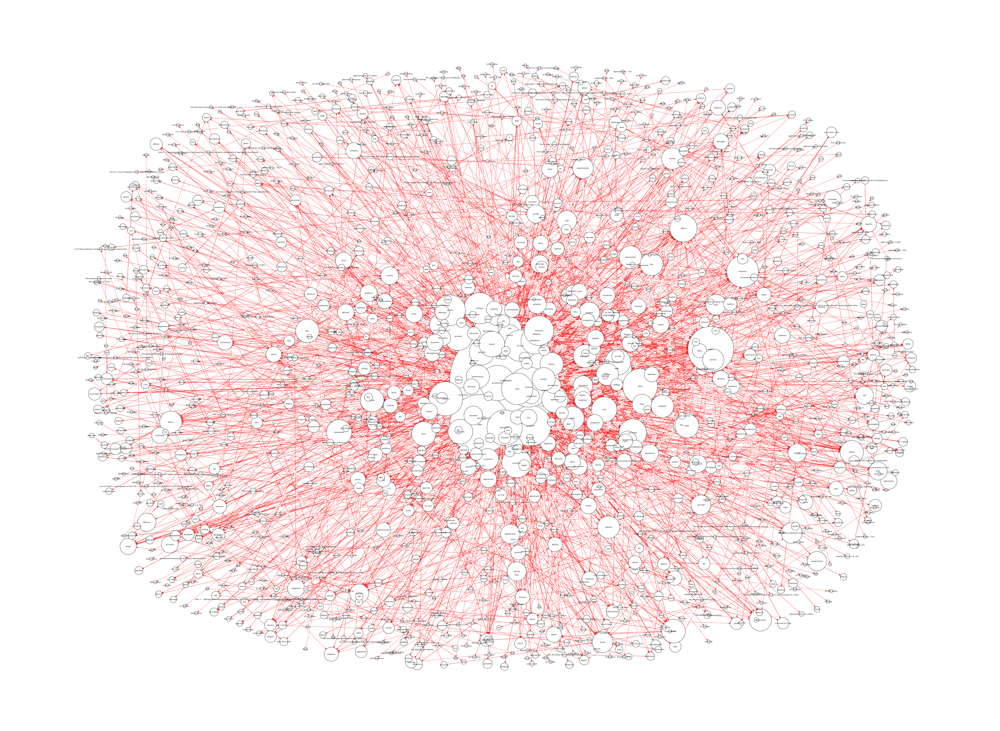

In [68]:
draw_kg(pairs)

In [69]:
def filter_graph(pairs, node):
    k_graph = nx.from_pandas_edgelist(pairs, 'subject', 'object',
            create_using=nx.MultiDiGraph())
    edges = nx.dfs_successors(k_graph, node)
    nodes = []
    for k, v in edges.items():
        nodes.extend([k])
        nodes.extend(v)
    subgraph = k_graph.subgraph(nodes)
    layout = (nx.random_layout(k_graph))
    nx.draw_networkx(
        subgraph,
        node_size=1000,
        arrowsize=20,
        linewidths=1.5,
        pos=layout,
        edge_color='red',
        edgecolors='black',
        node_color='white'
        )
    labels = dict(zip((list(zip(pairs.subject, pairs.object))),
                    pairs['relation'].tolist()))
    edges= tuple(subgraph.out_edges(data=False))
    sublabels ={k: labels[k] for k in edges}
    #print(k_graph.out_edges(data=False))
    nx.draw_networkx_edge_labels(subgraph, pos=layout, edge_labels=sublabels,
                                font_color='red')
    plt.axis('off')
    plt.show()

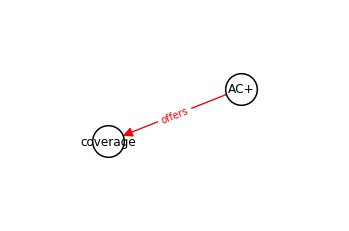

In [91]:
filter_graph(pairs,'AC+')